# Project IRA2: **Condus autonom - Detecția liniilor și benzilor utilizând Computer Vision**


## Metode parcurse:

-  **Loading test images**
-  **Camera Calibration**
-  **Apply Color Selection**
    -  HSL
-  **Apply Canny edge detection**
    -  Apply gray scaling to the images.
    -  Apply Gaussian smoothing.
    -  Perform Canny edge detection.
-  **Determine the region of interest**
-  **Apply Hough transform**
-  **Average and extrapolating the lane lines**
-  **Perspective (Bird's eye view)**
-  **Histogram**
-  **Steering angle**
-  **Apply on video**



##  Loading test images

In [31]:
#Importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import glob
from moviepy.editor import VideoFileClip

%matplotlib inline

In [32]:
def list_images(images, cols = 2, rows = 5, cmap=None):
    plt.figure(figsize=(10, 11))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        #Use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape) == 2 else cmap
        plt.imshow(image, cmap = cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

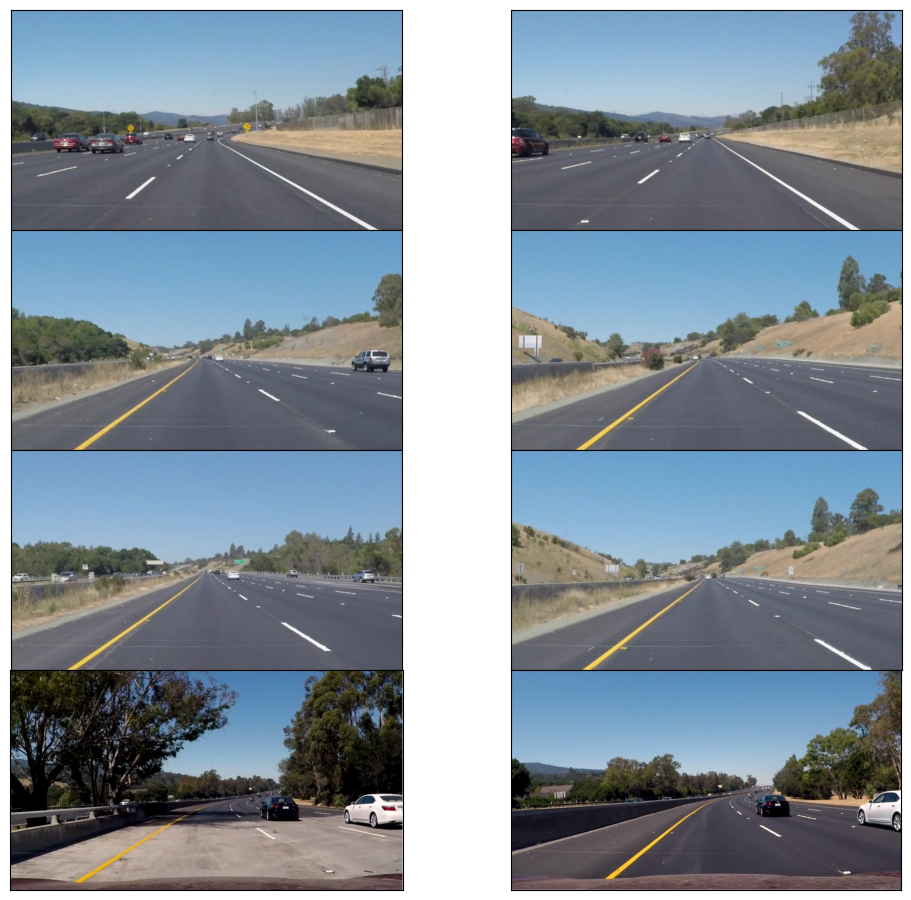

In [33]:
test_img = [plt.imread(img) for img in glob.glob('test_images/*.jpg')]
list_images(test_img)

##  Camera Calibration

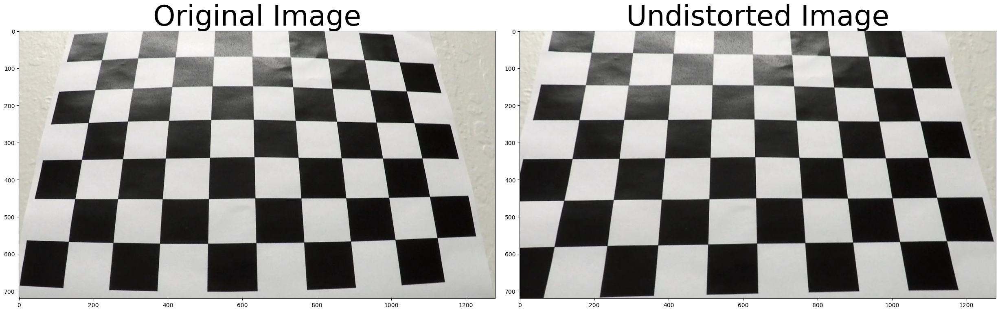

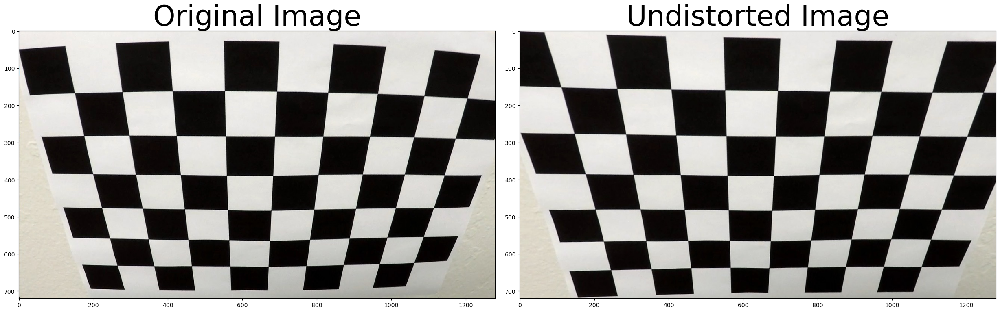

In [34]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

def collect_callibration_points():
    objpoints = []
    imgpoints = []
   
    images = glob.glob('./camera_cal/calibration*.jpg')
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1, 2)
    
    for fname in images:
        img = mpimg.imread(fname)

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
        
    return imgpoints, objpoints

def compare_images(image1, image2, image1_exp="Image 1", image2_exp="Image 2"):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1)
    ax1.set_title(image1_exp, fontsize=50)
    ax2.imshow(image2)
    ax2.set_title(image2_exp, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

imgpoints, objpoints = collect_callibration_points()
img = mpimg.imread('./camera_cal/calibration3.jpg')
undistorted, mtx, dist_coefficients = cal_undistort(img, objpoints, imgpoints)
compare_images(img, undistorted, "Original Image", "Undistorted Image")
img = mpimg.imread('./camera_cal/calibration2.jpg')
undistorted, mtx, dist_coefficients = cal_undistort(img, objpoints, imgpoints)
compare_images(img, undistorted, "Original Image", "Undistorted Image")

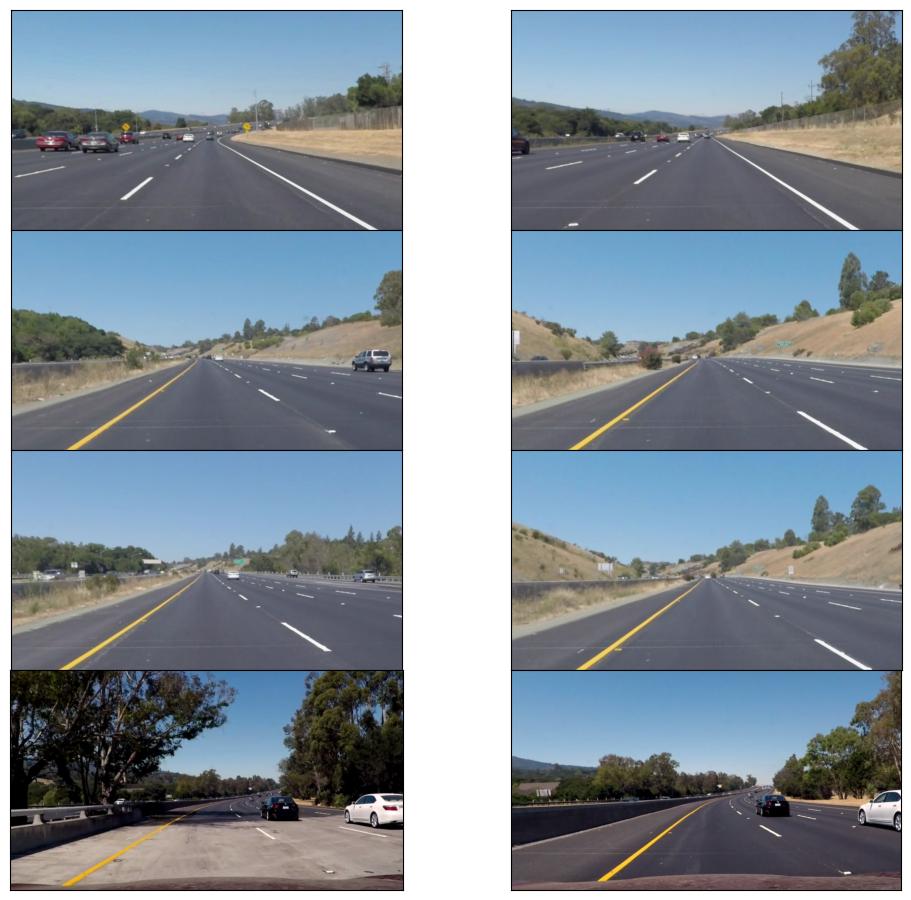

In [35]:
test_images = []

for img in test_img:
    undistorted_img, mtx, dist_coefficients = cal_undistort(img, objpoints, imgpoints)
    test_images.append(undistorted_img)
    
list_images(test_images)

##  Color Selection

### HSL color space

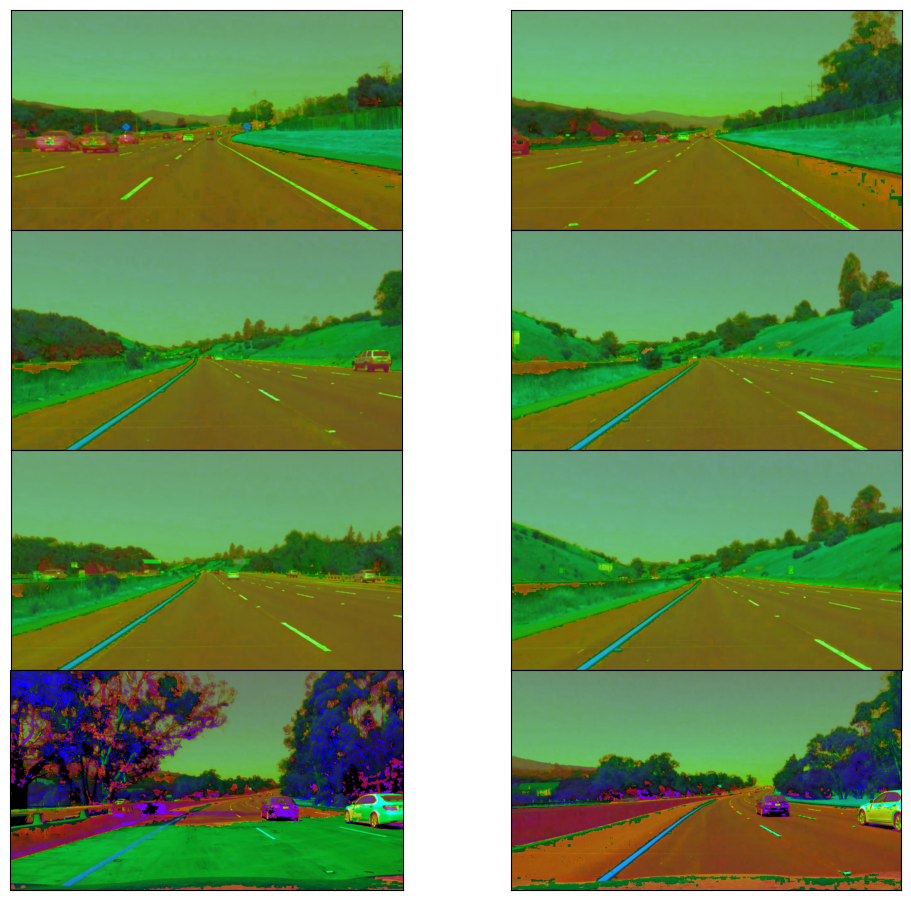

In [36]:
def convert_hsl(image):

    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

list_images(list(map(convert_hsl, test_images)))

In [37]:
def HSL_color_selection(image):
    
    #Convert the input image to HSL
    converted_image = convert_hsl(image)
    
    #White color mask
    lower_threshold = np.uint8([0, 200, 0])
    upper_threshold = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)
    
    #Yellow color mask
    lower_threshold = np.uint8([10, 0, 100])
    upper_threshold = np.uint8([40, 255, 255])
    yellow_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)
    
    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask = mask)
    
    return masked_image

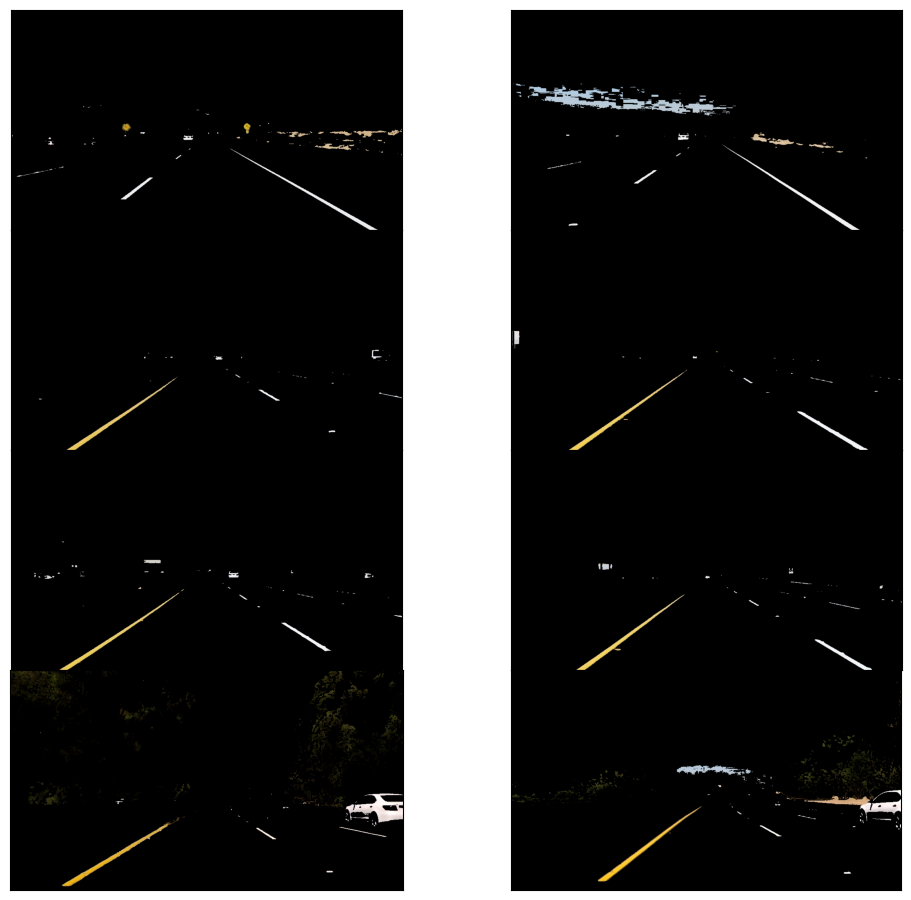

In [38]:
list_images(list(map(HSL_color_selection, test_images)))

In [39]:
color_selected_images = list(map(HSL_color_selection, test_images))

##  Canny Edge Detection

### a) Gray scaling the images

In [40]:
def gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

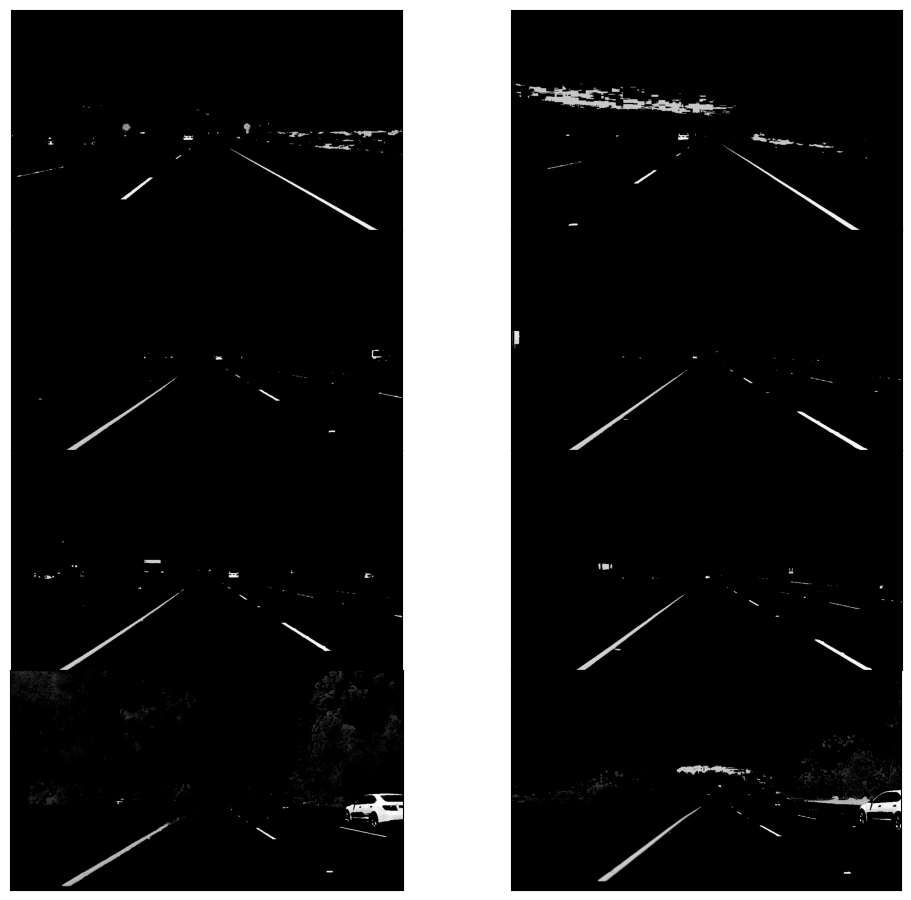

In [41]:
gray_images = list(map(gray_scale, color_selected_images))
list_images(gray_images)

### b) Applying Gaussian smoothing

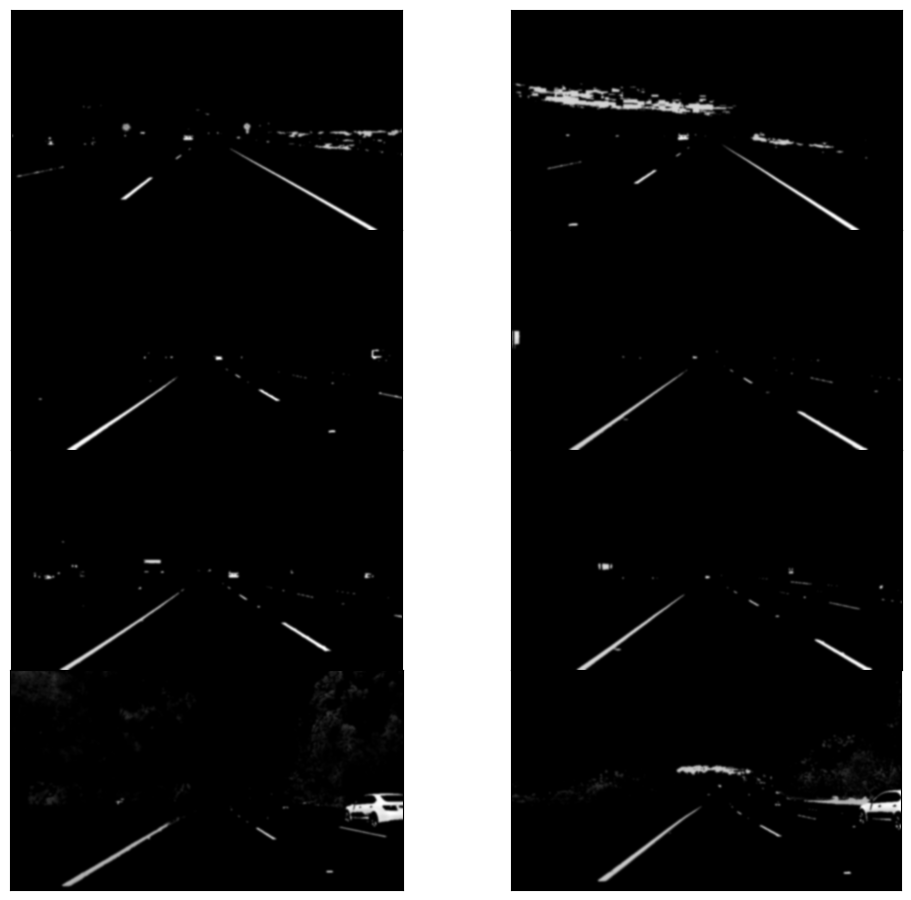

In [42]:
def gaussian_smoothing(image, kernel_size = 13):
    
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

blur_images = list(map(gaussian_smoothing, gray_images))
list_images(blur_images)

### c) Applying Canny Edge Detection

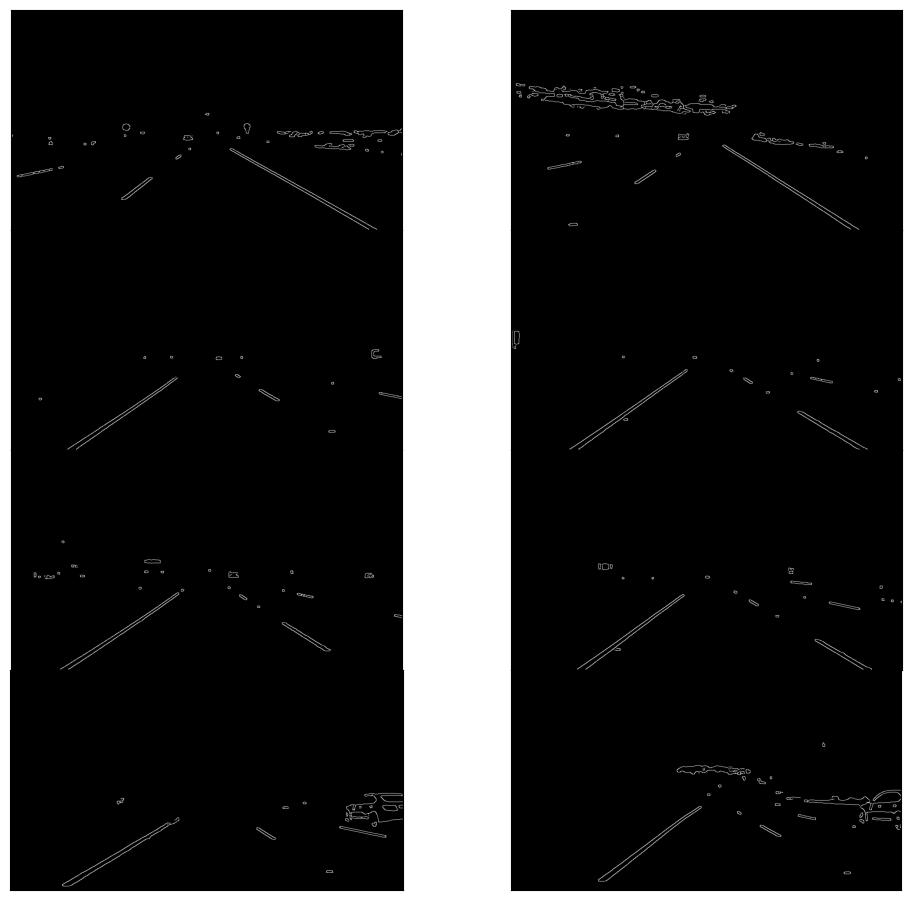

In [43]:
def canny_detector(image, low_threshold = 30, high_threshold = 100):

    return cv2.Canny(image, low_threshold, high_threshold)

edge_detected_images = list(map(canny_detector, blur_images))
list_images(edge_detected_images)

##  Region of interest

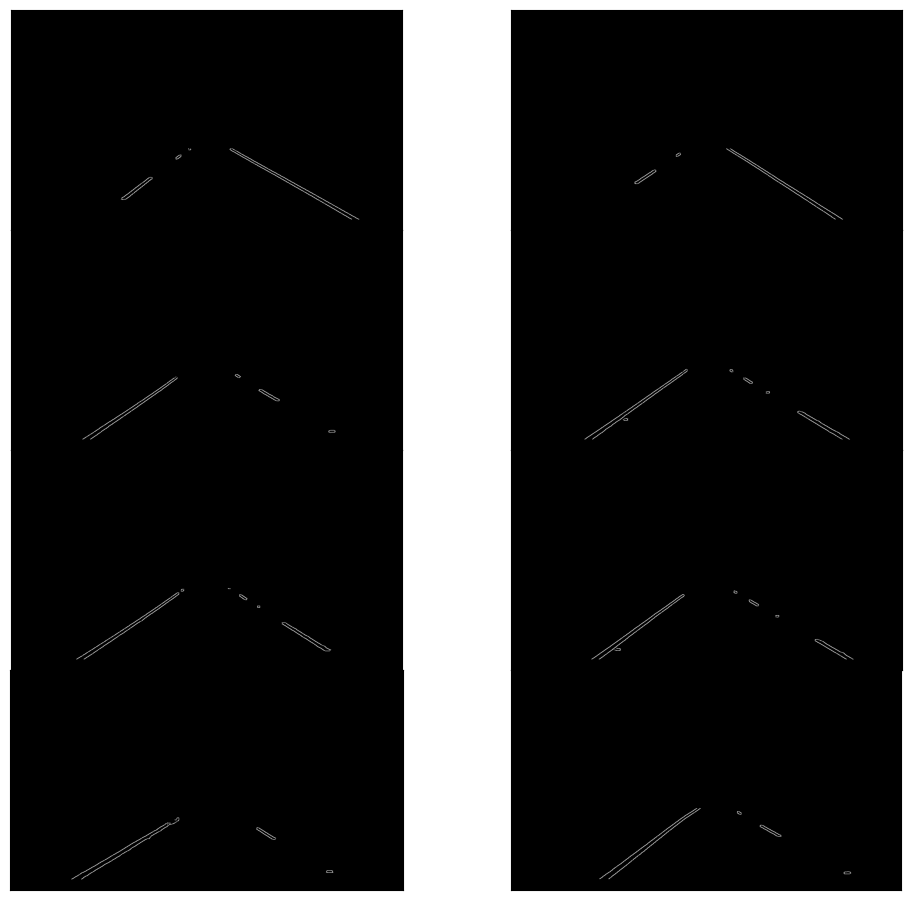

In [44]:
def region_selection(image):

    mask = np.zeros_like(image)   
    
    if len(image.shape) > 2:
        channel_count = image.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
   
    rows, cols = image.shape[:2]
    bottom_left  = [cols * 0.1, rows * 0.95]
    top_left     = [cols * 0.4, rows * 0.63]
    bottom_right = [cols * 0.9, rows * 0.95]
    top_right    = [cols * 0.6, rows * 0.63]
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

masked_image = list(map(region_selection, edge_detected_images))
list_images(masked_image)

##  Hough Transform

In [45]:
def hough_transform(image):
    
    rho = 1              
    theta = np.pi/180    
    threshold = 20       
    minLineLength = 20   
    maxLineGap = 300     
    return cv2.HoughLinesP(image, rho = rho, theta = theta, threshold = threshold,
                           minLineLength = minLineLength, maxLineGap = maxLineGap)

hough_lines = list(map(hough_transform, masked_image))

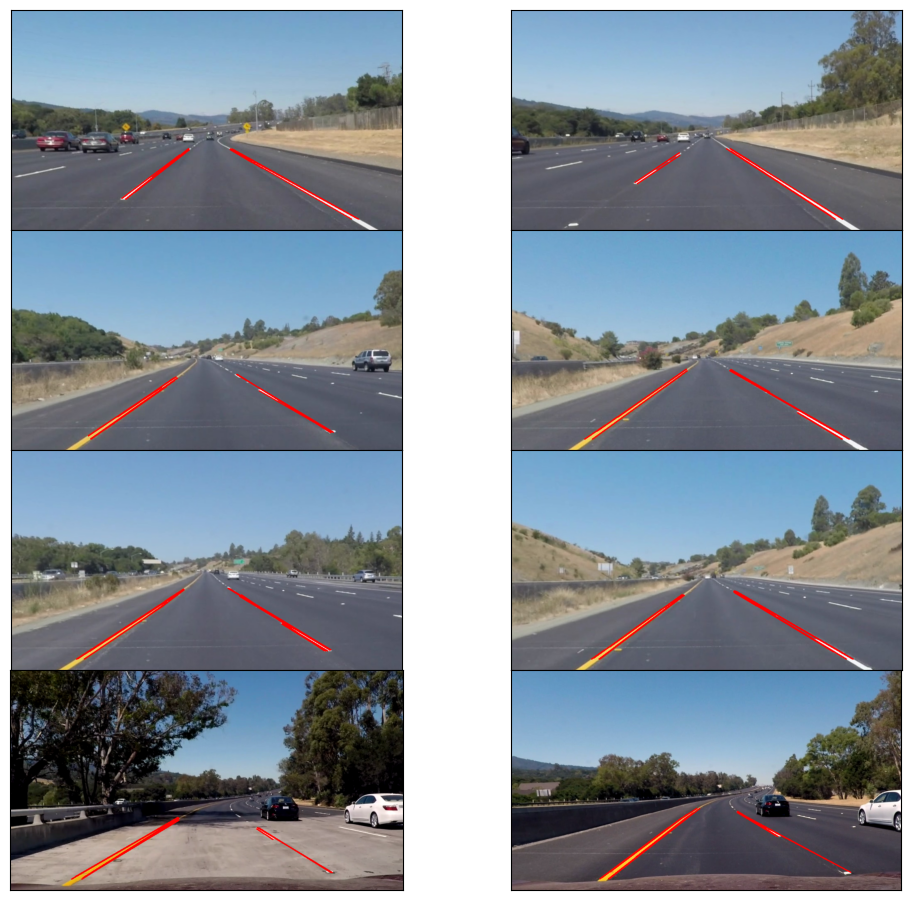

In [46]:
def draw_lines(image, lines, color = [255, 0, 0], thickness = 2):
    
    image = np.copy(image)
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    return image

line_images = []
for image, lines in zip(test_images, hough_lines):
    line_images.append(draw_lines(image, lines))
    
list_images(line_images)

##  Averaging and extrapolating the lane lines

In [47]:
def average_slope_intercept(lines):
    """
    Find the slope and intercept of the left and right lanes of each image.
        Parameters:
            lines: The output lines from Hough Transform.
    """
    left_lines    = [] #(slope, intercept)
    left_weights  = [] #(length,)
    right_lines   = [] #(slope, intercept)
    right_weights = [] #(length,)
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x1 == x2:
                continue
            slope = (y2 - y1) / (x2 - x1)
            intercept = y1 - (slope * x1)
            length = np.sqrt(((y2 - y1) ** 2) + ((x2 - x1) ** 2))
            if slope < 0:
                left_lines.append((slope, intercept))
                left_weights.append((length))
            else:
                right_lines.append((slope, intercept))
                right_weights.append((length))
    left_lane  = np.dot(left_weights,  left_lines) / np.sum(left_weights)  if len(left_weights) > 0 else None
    right_lane = np.dot(right_weights, right_lines) / np.sum(right_weights) if len(right_weights) > 0 else None
    return left_lane, right_lane

In [48]:
def pixel_points(y1, y2, line):
    
    if line is None:
        return None
    slope, intercept = line
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    y1 = int(y1)
    y2 = int(y2)
    return ((x1, y1), (x2, y2))

In [49]:
def lane_lines(image, lines):

    left_lane, right_lane = average_slope_intercept(lines)
    y1 = image.shape[0]
    y2 = y1 * 0.63
    left_line  = pixel_points(y1, y2, left_lane)
    right_line = pixel_points(y1, y2, right_lane)
    return left_line, right_line


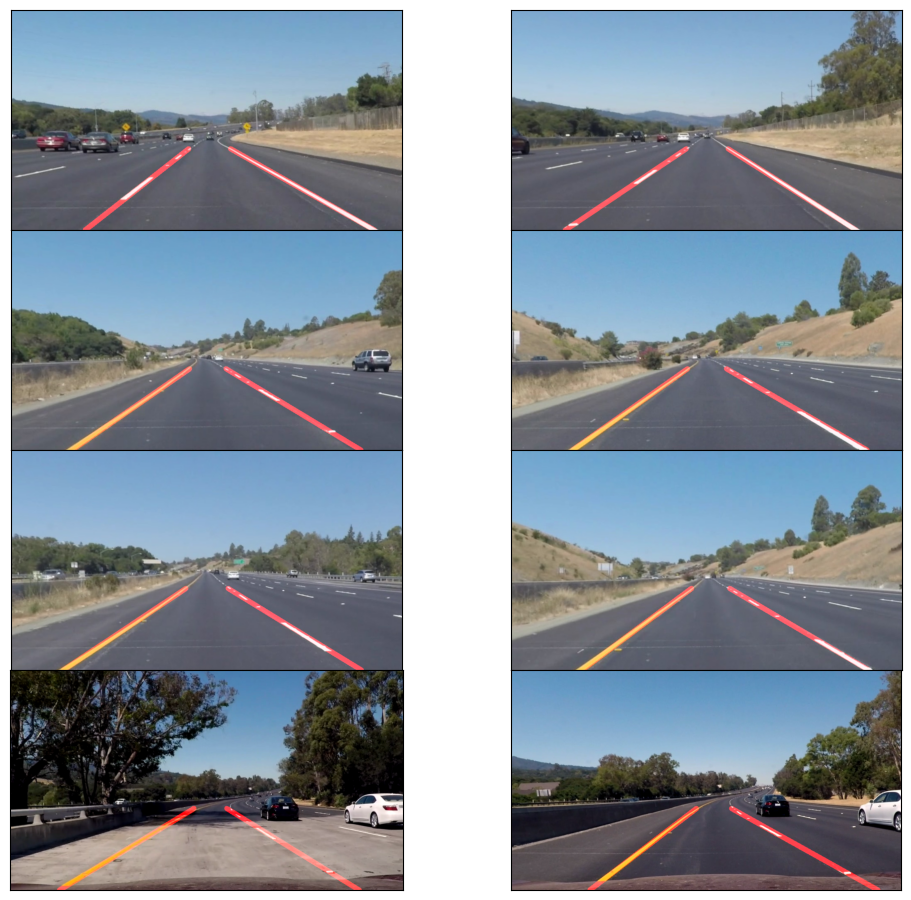

In [50]:
def draw_lane_lines(image, lines, color=[255, 0, 0], thickness=12):

    line_image = np.zeros_like(image)
    for line in lines:
        if line is not None:
            cv2.line(line_image, *line,  color, thickness)
    return cv2.addWeighted(image, 1.0, line_image, 1.0, 0.0)
             
    
lane_images = []
for image, lines in zip(test_images, hough_lines):
    lane_images.append(draw_lane_lines(image, lane_lines(image, lines)))

list_images(lane_images)

##  Perspective (Bird's eye view)

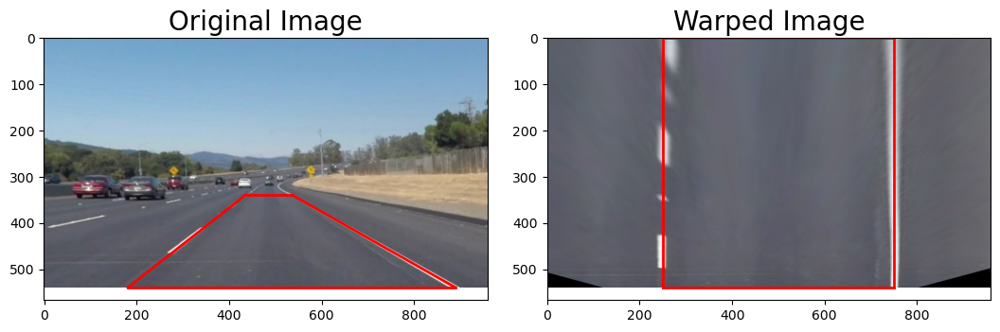

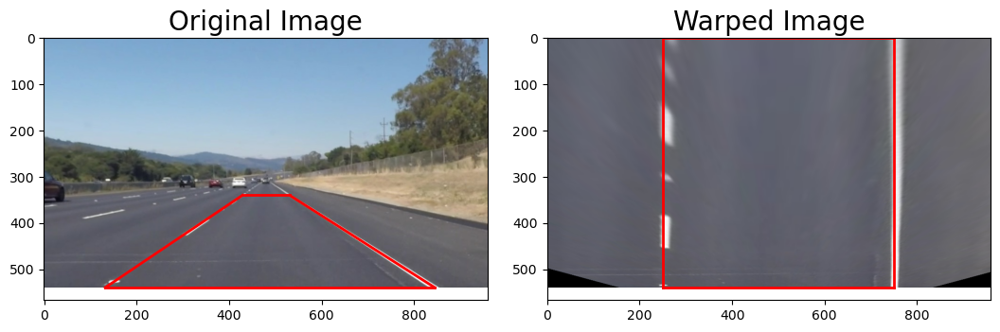

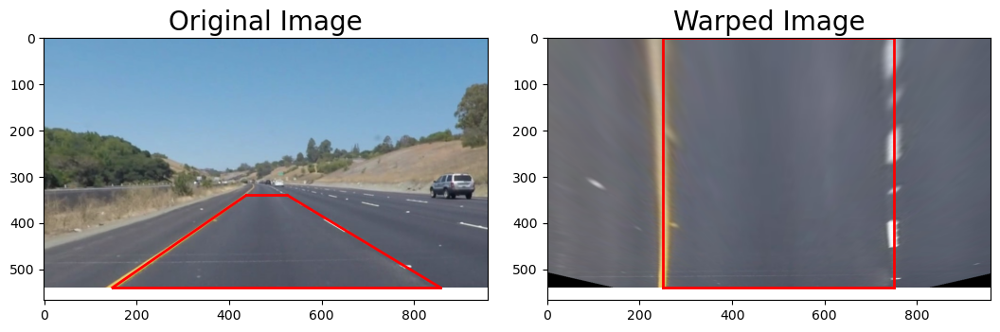

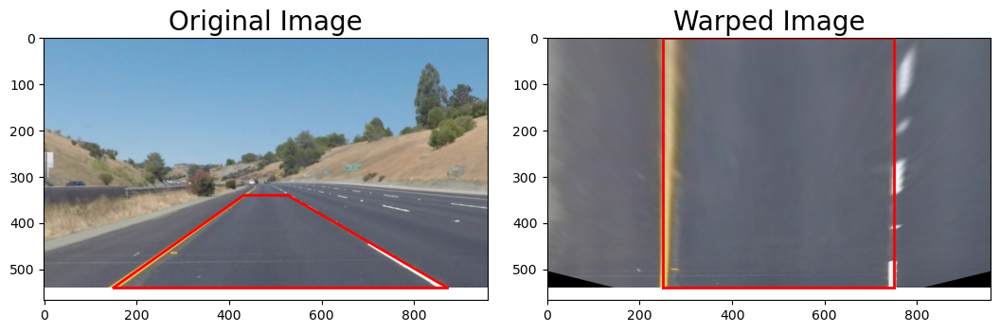

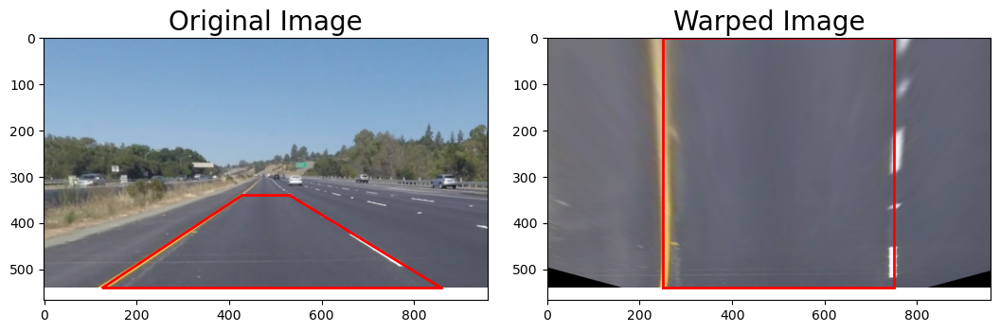

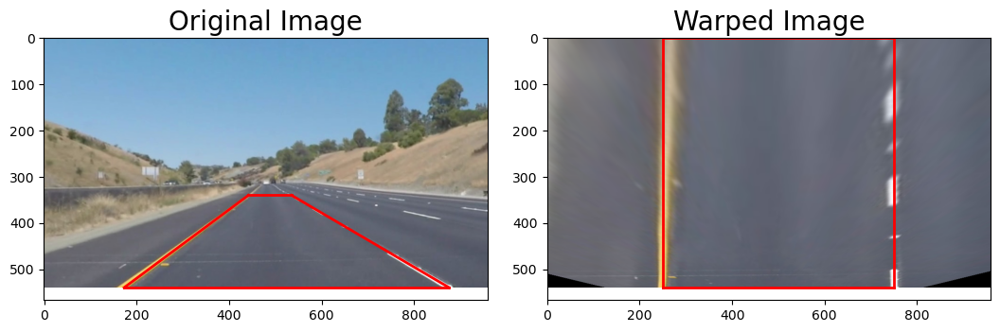

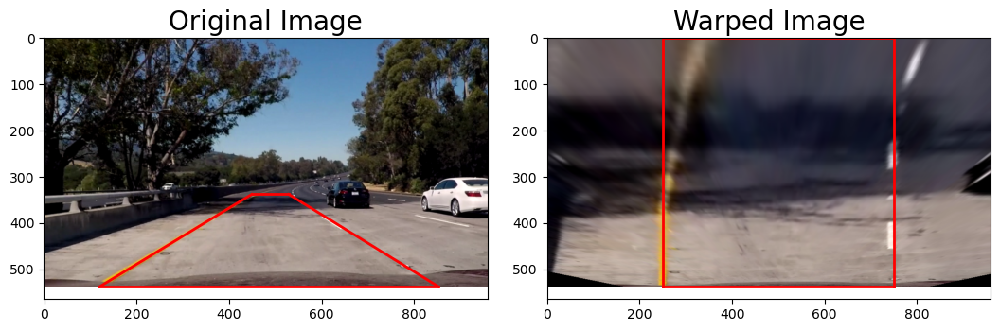

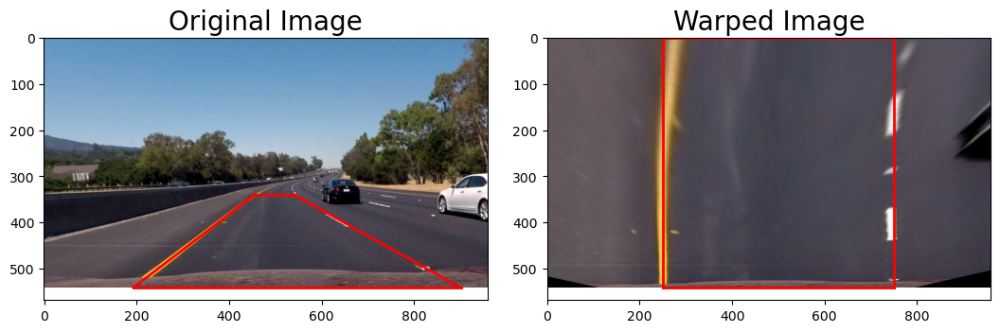

In [51]:
for image, lines in zip(test_images, hough_lines):
    left_line, right_line = lane_lines(image, lines)

    def warp(img):
        img_size = (img.shape[1], img.shape[0])
        
        src = np.float32(
            [[right_line[1][0], right_line[1][1]], 
              [right_line[0][0], right_line[0][1]], 
              [left_line[0][0], left_line[0][1]], 
              [left_line[1][0], left_line[1][1]]])
    
        dst = np.float32(
            [[750, 0], 
              [750, right_line[0][1]], 
              [250, left_line[0][1]], 
              [250, 0]])
        
        M = cv2.getPerspectiveTransform(src, dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
    
       
        binary_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
       
        return binary_warped, Minv
    
    def compare_plotted_images(image1, image2, image1_exp="Image 1", image2_exp="Image 2"):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 11))
        f.tight_layout()
        ax1.imshow(image1)
        ax1.plot([right_line[1][0], right_line[0][0]], [right_line[1][1], right_line[0][1]], color='r', linewidth="2")
        ax1.plot([right_line[0][0], left_line[0][0]], [right_line[0][1], right_line[0][1]], color='r', linewidth="2")
        ax1.plot([left_line[0][0], left_line[1][0]], [right_line[0][1], right_line[1][1]], color='r', linewidth="2")
        ax1.plot([left_line[1][0], right_line[1][0]], [right_line[1][1], right_line[1][1]], color='r', linewidth="2")
        ax1.set_title(image1_exp, fontsize=20)
        ax2.imshow(image2)
        ax2.plot([750, 750], [0, right_line[0][1]], color='r', linewidth="2")
        ax2.plot([750, 250], [right_line[0][1], right_line[0][1]], color='r', linewidth="2")
        ax2.plot([250, 250], [right_line[0][1], 0], color='r', linewidth="2")
        ax2.plot([250, 750], [0, 0], color='r', linewidth="2")
        ax2.set_title(image2_exp, fontsize=20)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    warped_image, Minv = warp(image)
    
    # Compară imaginile
    compare_plotted_images(image, warped_image, "Original Image", "Warped Image")



##  Histogram 

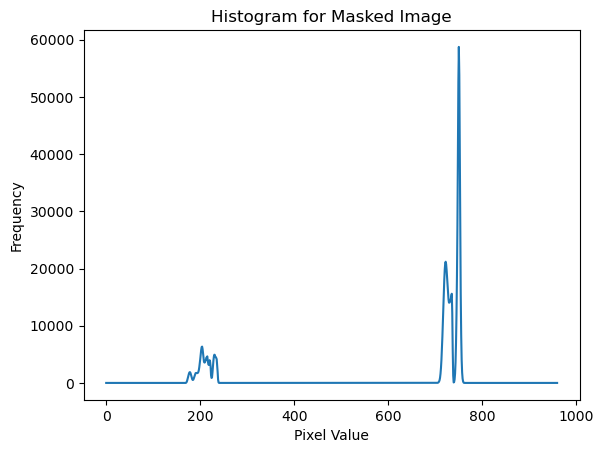

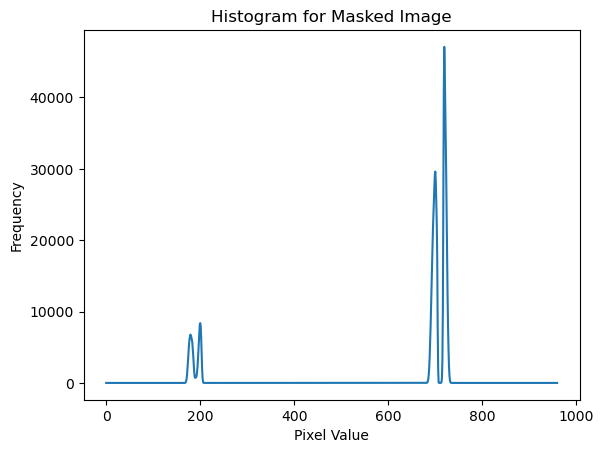

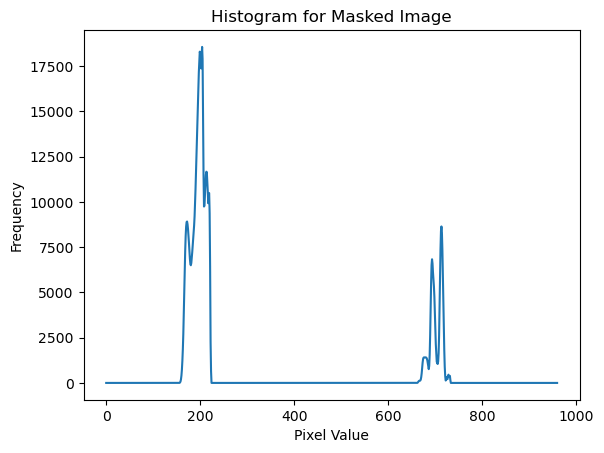

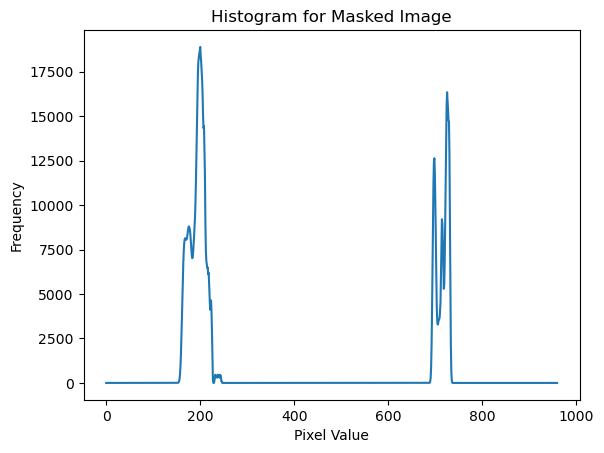

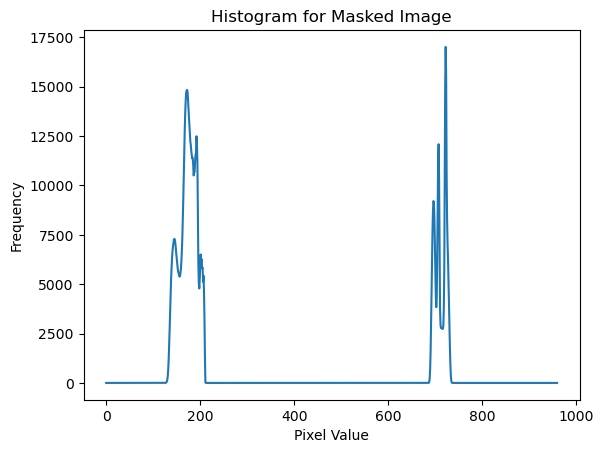

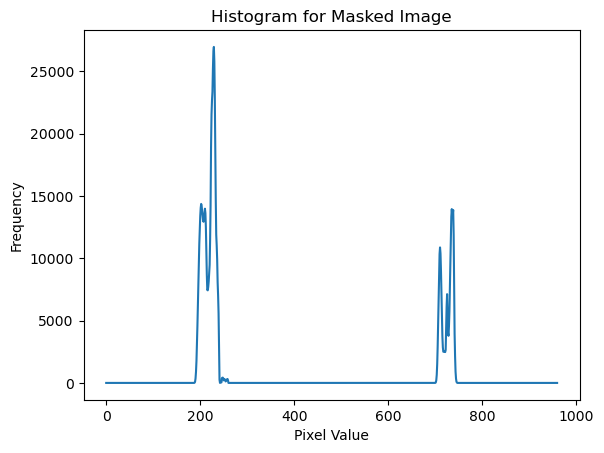

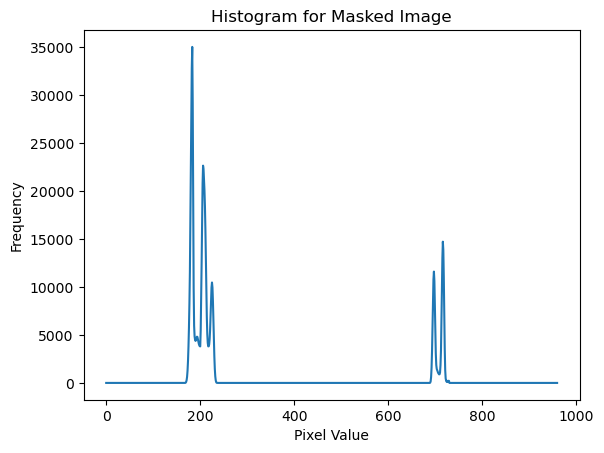

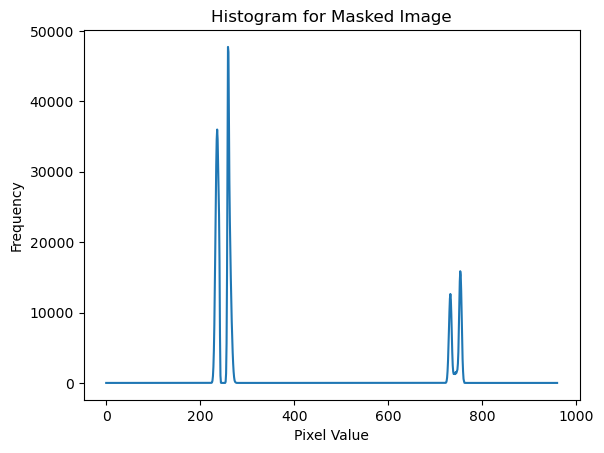

In [52]:
def get_histogram(image):
    histogram = np.sum(image[image.shape[0]//2:,:], axis=0)
    return histogram

for image, lines in zip(masked_image, hough_lines):
    binary_warped, Minv = warp(image)
    histogram = get_histogram(binary_warped)
    plt.figure()  
    plt.plot(histogram)
    plt.title('Histogram for Masked Image')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()  

##  Steering angle

In [53]:
def calculate_steering_angle(histogram):
    midpoint = len(histogram) // 2
    left_peak = np.argmax(histogram[:midpoint])
    right_peak = np.argmax(histogram[midpoint:]) + midpoint
    offset = (left_peak + right_peak) / 2 - midpoint
    max_offset = midpoint / 2
    steering_angle = np.arctan(offset / max_offset) * 45 / np.pi
    return steering_angle

##  Apply on video 

In [54]:
#Import everything needed to edit/save/watch video clips
from moviepy import *
from IPython.display import HTML
from IPython.display import Image

In [58]:
def frame_processor(image):

    image, mtx, dist_coefficients = cal_undistort(image, objpoints, imgpoints)
    color_select = HSL_color_selection(image)
    gray         = gray_scale(color_select)
    smooth       = gaussian_smoothing(gray)
    edges        = canny_detector(smooth)
    region       = region_selection(edges)
    hough        = hough_transform(region)

    binary_warped, Minv = warp(region)
    histogram           = get_histogram(binary_warped)
    steering_angle      = calculate_steering_angle(histogram)
    cv2.putText(image, f'Steering Angle: {steering_angle:.2f} degrees', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    result       = draw_lane_lines(image, lane_lines(image, hough))
    
    return result 

In [59]:
def process_video(test_video, output_video):

    input_video = VideoFileClip(os.path.join('test_videos', test_video), audio=False)
    processed = input_video.fl_image(frame_processor)
    processed.write_videofile(os.path.join('output_videos', output_video), audio=False)

In [60]:
%time process_video('solidWhiteRight.mp4', 'solidWhiteRight_output.mp4')
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("output_videos\solidWhiteRight_output.mp4"))

Moviepy - Building video output_videos\solidWhiteRight_output.mp4.
Moviepy - Writing video output_videos\solidWhiteRight_output.mp4



Moviepy - Done !
Moviepy - video ready output_videos\solidWhiteRight_output.mp4
CPU times: total: 6min 12s
Wall time: 7min 12s


In [61]:
%time process_video('solidYellowLeft.mp4', 'solidYellowLeft_output.mp4')
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("output_videos\solidYellowLeft_output.mp4"))

Moviepy - Building video output_videos\solidYellowLeft_output.mp4.
Moviepy - Writing video output_videos\solidYellowLeft_output.mp4



Moviepy - Done !
Moviepy - video ready output_videos\solidYellowLeft_output.mp4
CPU times: total: 17min 56s
Wall time: 19min 9s


In [62]:
%time process_video('original.mp4', 'original_output.mp4')
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("output_videos\original_output.mp4"))

Moviepy - Building video output_videos\original_output.mp4.
Moviepy - Writing video output_videos\original_output.mp4



Moviepy - Done !
Moviepy - video ready output_videos\original_output.mp4
CPU times: total: 26min 14s
Wall time: 24min 54s
